# Imports


In [ ]:
# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import pickle
import gzip
import sys
import os
import datetime as dt
from pathlib import Path


# Basics of Python data handling and visualization
import numpy as np
np.random.seed(42)
#import geopandas as gpd
import matplotlib as mpl
from matplotlib.colors import Normalize
Normalize = Normalize(vmin = 0, vmax= 1)
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import ImageGrid
from tqdm.auto import tqdm
from tqdm import tqdm


#PREPROCESSING CHAIN
import skimage
from skimage.filters import threshold_multiotsu, threshold_otsu, median, gaussian, threshold_li
import skimage.morphology as morphology
from skimage.morphology import disk, square, diamond, closing, opening, black_tophat, white_tophat, dilation, erosion
from skimage.segmentation import chan_vese , morphological_chan_vese, checkerboard_level_set, circle_level_set, clear_border
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from skimage.exposure import *
from skimage import util
from skimage.util import invert

from sklearn.preprocessing import minmax_scale

# Data Path
datapath = '/content/drive/MyDrive/Colab Notebooks/data/hindiya_data/'
datapath_shared = '/content/drive/MyDrive/AI for Earth Share/Sub-Groups/Dying Rivers/Data/hindiya_data/'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks/')
from mytools import *

# Loading Sample Data

In [ ]:
datafile = "hindya_LND4_5TM0.gz"
with gzip.open (datapath + datafile, 'rb') as f:
  tm0 = pickle.load(f)

In [ ]:
# "B01", "B02", "B03", "B04", "B05", "B06", "B07"
LND_processor = get_indexes()

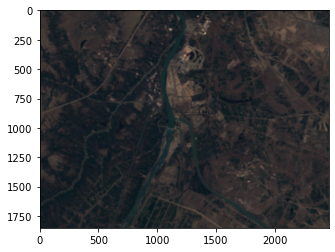

In [ ]:
LND_processor.image = tm0[39]
plt.imshow(LND_processor.color())

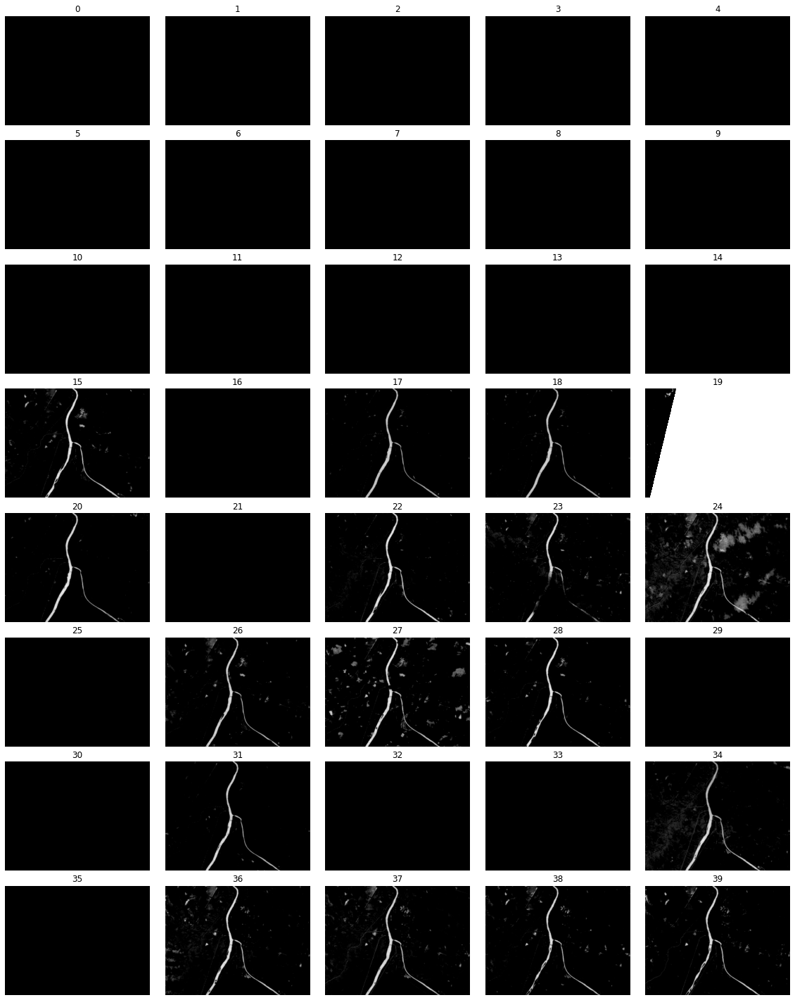

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid
fig = plt.figure(figsize = (20,60))
grid = ImageGrid(fig, 111, nrows_ncols= (8,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, mndwi_tm0)):
    qrt.imshow(np.clip(img, 0, 1 ), cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()


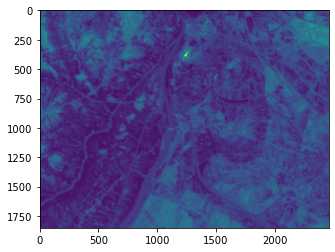

In [ ]:
plt.imshow(LND_processor.image[...,1])

# Batch Create Indexes

In [ ]:
import os
filenames = [file for file in sorted(os.listdir(datapath))]
for filename in filenames:
    print(filename)

hindya_LND4_5TM1.gz
hindya_LND4_5TM2.gz
hindya_LND4_5TM3.gz
hindya_LND4_5TM4.gz
hindya_LND4_5TM5.gz
hindya_LND4_5TM6.gz
hindya_LND4_5TM7.gz
hindya_LND4_5TM0.gz
hindya_LND8_OTI0.gz
hindya_LND8_OTI1.gz
hindya_LND8_OTI2.gz
hindya_LND8_OTI3.gz
hindya_SENT2_0.gz
hindya_SENT2_1.gz
hindya_SENT2_2.gz


## Create the mNDWI

In [ ]:
water_list = []
for filename in filenames:
    with gzip.open(datapath + '/' + filename , 'rb') as f:
        batch = pickle.load(f)
        water = process_water(batch)
        del batch
        water_list.append(water)
        del water

/content/drive/MyDrive/Colab Notebooks/mytools.py:89: RuntimeWarning: invalid value encountered in true_divide
  mndwi = (self.green - self.swir) / (self.green + self.swir)


In [ ]:
with gzip.open('water.gz', 'wb') as f:
    pickle.dump(water_list, f)

del water_list

## Create the NDVI

In [ ]:
veg_list = []
for filename in filenames:
    with gzip.open(datapath + '/' + filename , 'rb') as f:
        batch = pickle.load(f)
        veg = process_veg(batch)
        del batch
        veg_list.append(veg)
        del veg

In [ ]:
with gzip.open('veg.gz', 'wb') as f:
    pickle.dump(veg_list, f)

del veg_list

## Create the NBI

In [ ]:
urban_list = []
for filename in filenames:
  with gzip.open(datapath + '/' + filename , 'rb') as f:
      batch = pickle.load(f)
      urban = process_urban(batch)
  del batch
  urban_list.append(urban)
  del urban

In [ ]:
with gzip.open('urban.gz', 'wb') as f:
    pickle.dump(urban_list, f)
del urban_list

## Create the colored images

In [ ]:
color_list = []
for filename in filenames:
  with gzip.open(datapath + '/' + filename , 'rb') as f:
      batch = pickle.load(f)
      color = process_color(batch)
  del batch
  color_list.append(color)
  del color

In [ ]:
with gzip.open('color.gz', 'wb') as f:
    pickle.dump(color_list, f)
del color_list

# Load & display a sample of the indecies

In [ ]:
color = color_list[50:90]
veg = veg_list[50:90]
water = water_list[50:90]

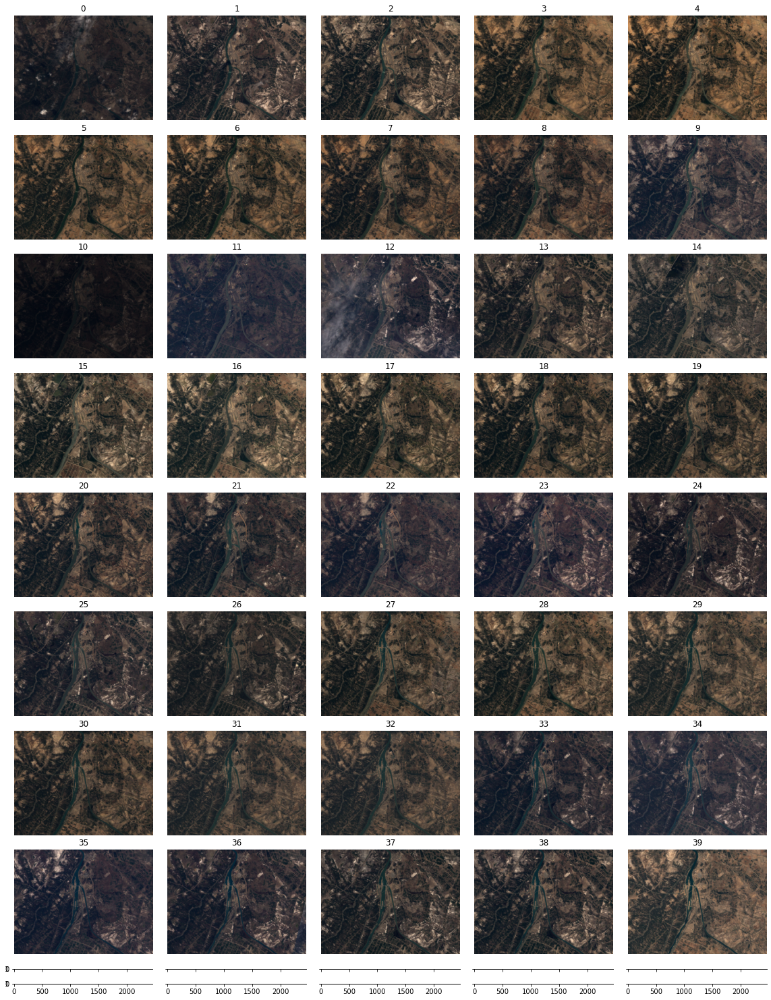

In [ ]:
fig = plt.figure(figsize = (20,80))
grid = ImageGrid(fig, 111, nrows_ncols= (10,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, color)):
    qrt.imshow(img, cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()


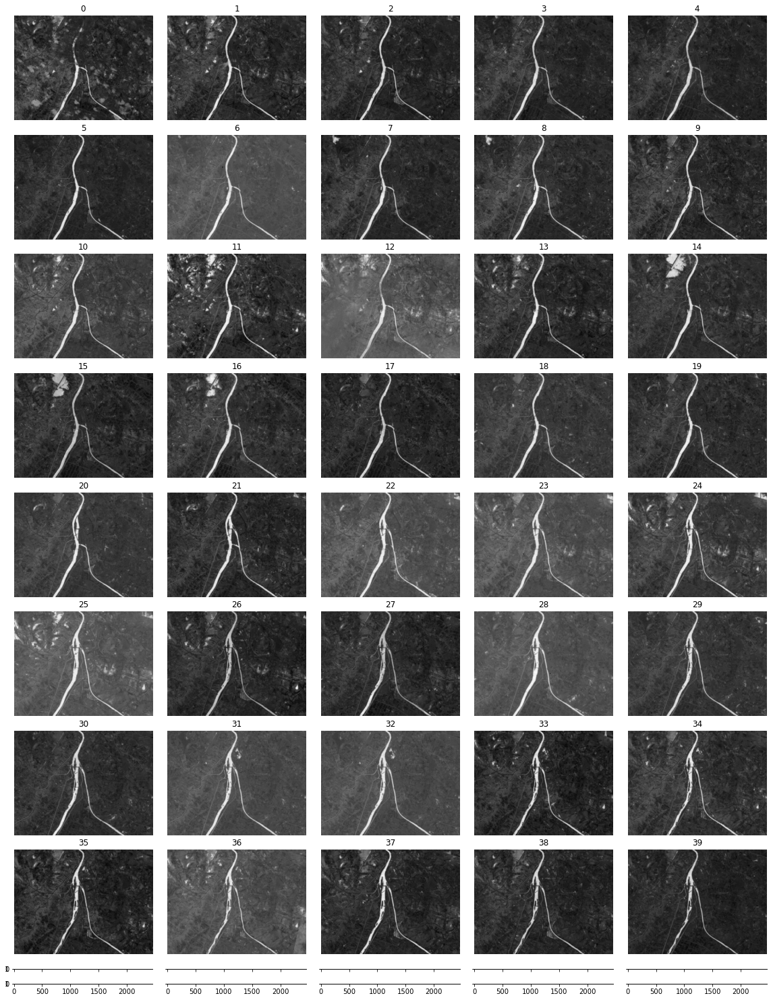

In [ ]:
fig = plt.figure(figsize = (20,80))
grid = ImageGrid(fig, 111, nrows_ncols= (10,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, water)):
    qrt.imshow(img, cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()


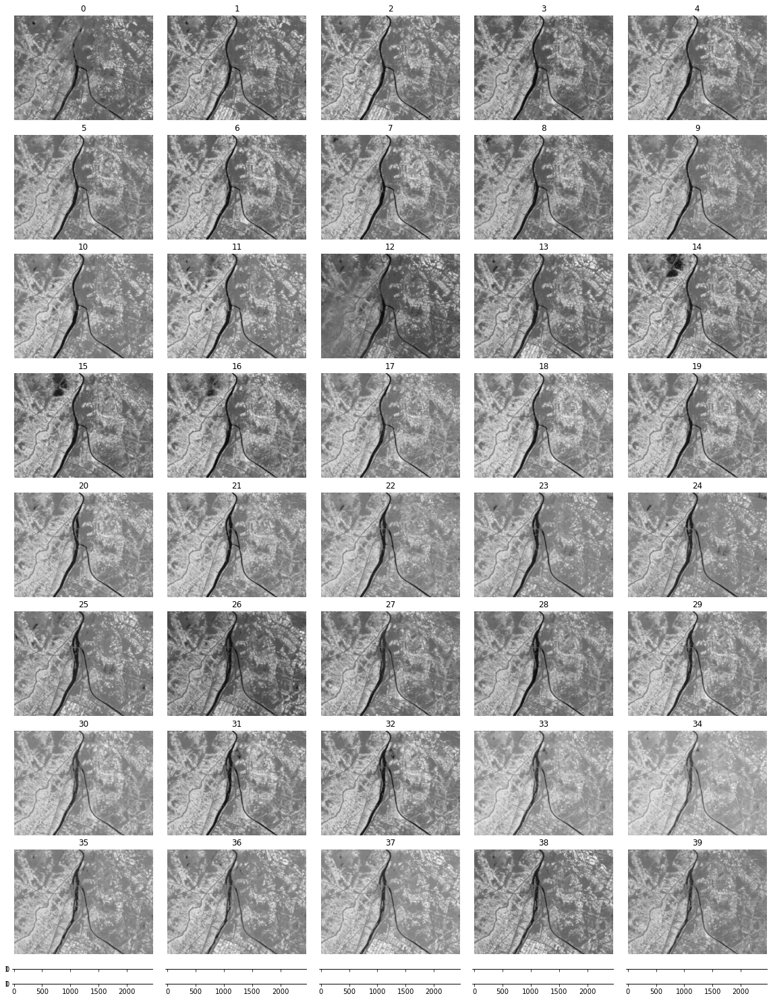

In [ ]:
fig = plt.figure(figsize = (20,80))
grid = ImageGrid(fig, 111, nrows_ncols= (10,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, veg)):
    qrt.imshow(img, cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()

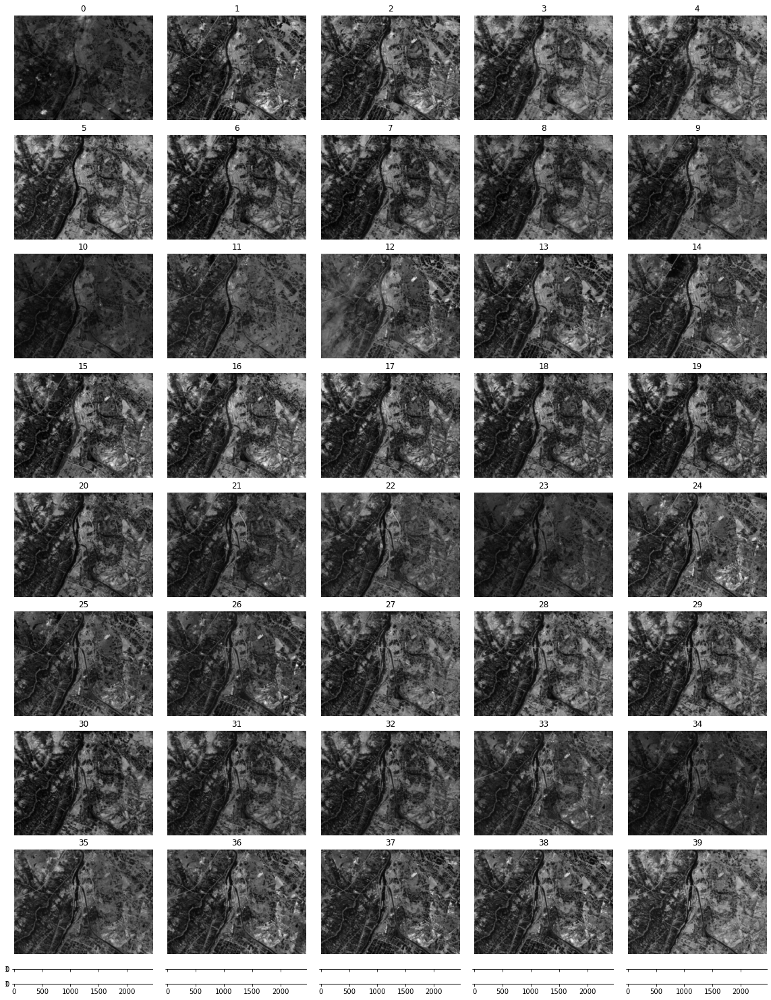

In [ ]:
fig = plt.figure(figsize = (20,80))
grid = ImageGrid(fig, 111, nrows_ncols= (10,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, urban)):
    qrt.imshow(img, cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()

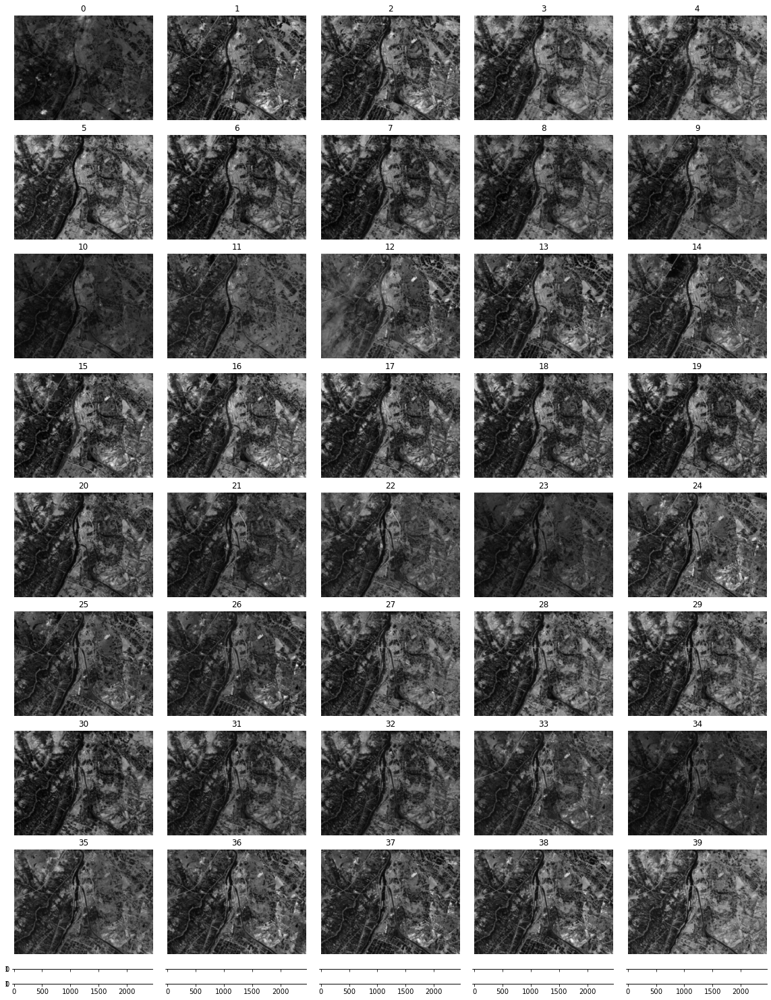

In [ ]:
fig = plt.figure(figsize = (20,80))
grid = ImageGrid(fig, 111, nrows_ncols= (10,5), axes_pad=0.3)

for t, (qrt, img) in enumerate (zip(grid, urban)):
    qrt.imshow(rescale_intensity(img,(0,.8)) , cmap = 'gray')
    qrt.set_title(t)
    qrt.set_axis_off()
plt.show()